In [3]:
import sys, os

# 1) Calcula la ruta ABSOLUTA a la carpeta que contiene multiplex_pipeline/
project_root = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
# 2) Inserta ese path al principio de sys.path
sys.path.insert(0, project_root)

# Opcional: Comprueba
print("Project root:", project_root)
print("Contiene:", os.listdir(project_root))


Project root: \\imgserver.cnio.es\IMAGES\CONFOCAL\IA\CMU\tfm_colab\MultiplexAnalysisProgram
Contiene: ['.ipynb_checkpoints', 'ck+Tregs.png', 'ck- tregs.png', 'jgagulloMuestra.ipynb', 'jgagulloMuestra.md', 'multiplex_pipeline', 'old results', 'Thumbs.db']


In [3]:
# Librerías estándar y científicas
import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tifffile
import imageio.v2 as imageio
import seaborn as sns
from joblib import Parallel, delayed
from scipy.spatial import cKDTree
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects, remove_small_holes, binary_dilation, binary_closing, disk
from matplotlib.colors import ListedColormap
import numpy as np

from multiplex_pipeline.io.loaders        import load_csv_data
from multiplex_pipeline.utils.helpers     import extract_roi_number, invert_dict
from multiplex_pipeline.utils.validation  import verify_binary
from multiplex_pipeline.preprocessing.segmentation import post_process_mask, post_process_mask_closing
from multiplex_pipeline.analysis.intensity       import process_roi
from multiplex_pipeline.analysis.spatial         import (
    compute_mask_area_summary,
    compute_subpop_cells_per_area,
    compute_distances,
    get_centroids,
    compute_subpop_distances
)
from multiplex_pipeline.analysis.positivity      import *
from multiplex_pipeline.analysis.subpopulations  import *
from multiplex_pipeline.visualization.overlays   import (
    create_color_composite,
    plot_conditional_cells_channels,
 compute_and_plot_subpop_distances_for_all_rois,
compute_and_save

)
from multiplex_pipeline.visualization.qc   import plot_masks

from multiplex_pipeline.preprocessing.segmentation import create_channel_masks


## 1. Load OME-TIFF images

In [4]:
from multiplex_pipeline.config import DATA_FOLDER
from multiplex_pipeline.io.loaders import load_ome_tif_images

images_dict = load_ome_tif_images(DATA_FOLDER)

print(f"{len(images_dict)} images loaded.")
for name, image in images_dict.items():
    print(f"{name}: {image.shape}")


Loading OME-TIFF images:   0%|                                                                 | 0/13 [00:11<?, ?img/s]

1 images loaded.
ROI1.ome.tiff: (22, 7700, 9322)


## 2. Load DAPI masks and plot

Loading DAPI masks: 100%|████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 28.87mask/s]


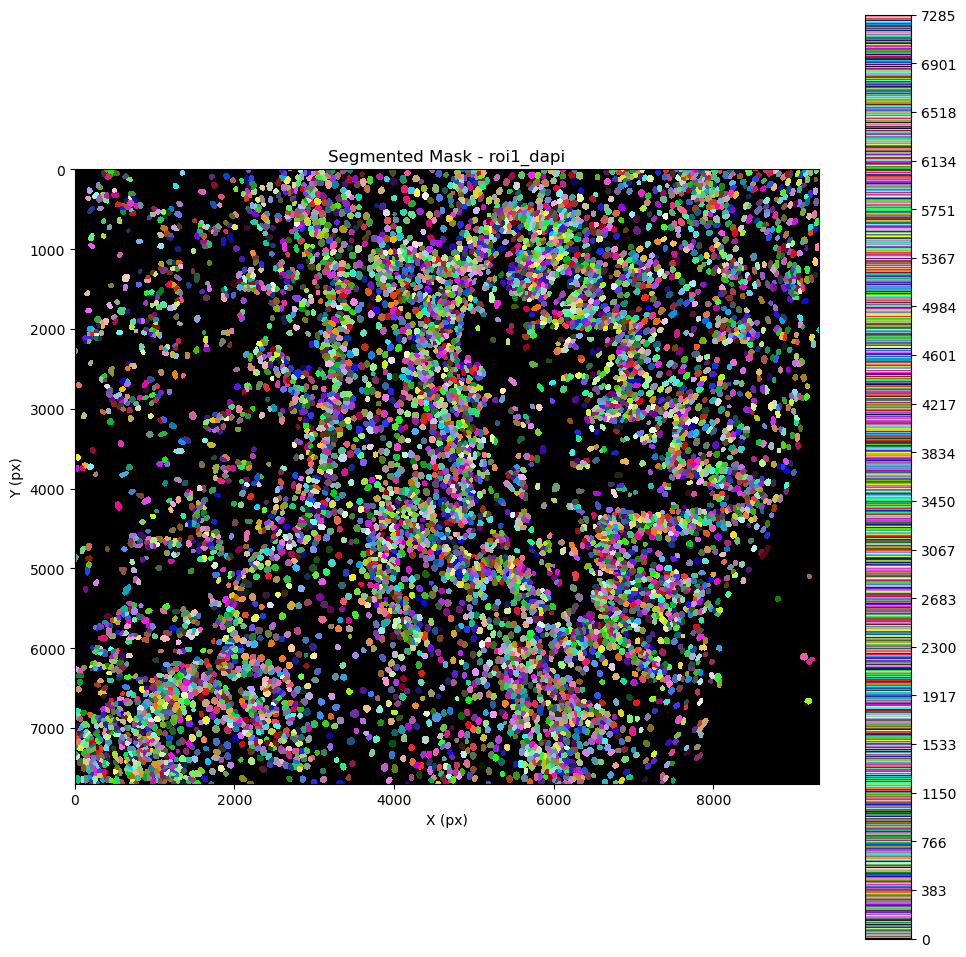

Number of unique labels in roi1_dapi (excluding background): 7285


In [7]:
from multiplex_pipeline.config import EXPORT_DAPI_FOLDER
from multiplex_pipeline.io.loaders import load_dapi_masks
from multiplex_pipeline.visualization.qc import plot_masks

dapi_masks_dict = load_dapi_masks(EXPORT_DAPI_FOLDER)
plot_masks(dapi_masks_dict)


## 3. Create CK masks

Holes ≤ 10000 px filled.
Objects < 2000 px removed.
Saved: \\imgserver.cnio.es\IMAGES\CONFOCAL\IA\Projects\2024\2024_10_21_jgagullo\spatial analisis\qpath\qpathprojects\jgagullo\exportedmasks\ROI1.ome.tiff - ROI1\CK_mask_binary.tif


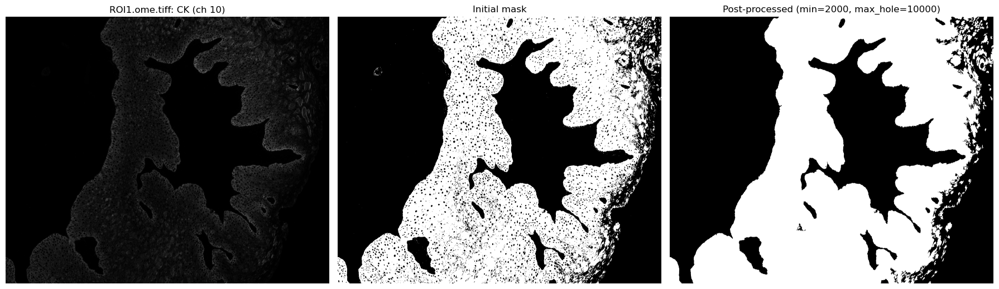

Keys in ck_masks_dict: ['roi1']


In [9]:
from multiplex_pipeline.config import CK_SETTINGS
from multiplex_pipeline.preprocessing.segmentation import create_channel_masks

ck_masks_dict = create_channel_masks(
    images_dict=images_dict,
    dapi_masks_dict=dapi_masks_dict,
    **CK_SETTINGS
)
print("Keys in ck_masks_dict:", list(ck_masks_dict.keys()))


## 4. Create NGFR masks

Performed closing (disk radius=20).
Holes ≤ 75000 px filled.
Objects < 200 px removed.
Saved: \\imgserver.cnio.es\IMAGES\CONFOCAL\IA\Projects\2024\2024_10_21_jgagullo\spatial analisis\qpath\qpathprojects\jgagullo\exportedmasks\ROI1.ome.tiff - ROI1\NGFR_mask_binary.tif


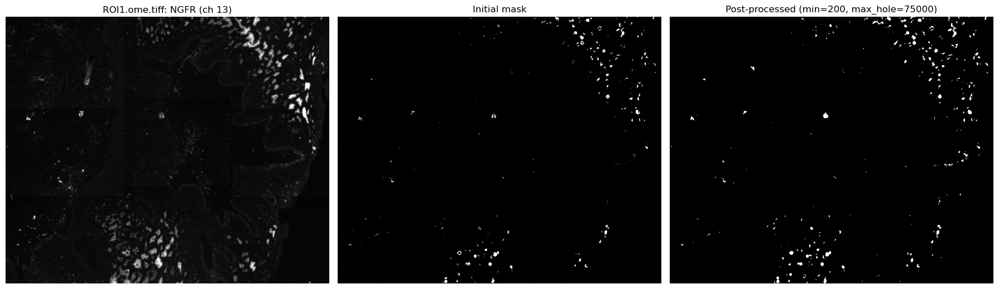

Keys in ngfr_masks_dict: ['roi1']


In [11]:
from multiplex_pipeline.config import NGFR_SETTINGS
from multiplex_pipeline.preprocessing.segmentation import create_channel_masks

ngfr_masks_dict = create_channel_masks(
    images_dict=images_dict,
    dapi_masks_dict=dapi_masks_dict,
    **NGFR_SETTINGS
)
print("Keys in ngfr_masks_dict:", list(ngfr_masks_dict.keys()))


In [13]:
# ────────────────────────────────────────────────────────────────────────
# Compute per-ROI intensity metrics and assemble into a single DataFrame
# ────────────────────────────────────────────────────────────────────────
from multiplex_pipeline.config import (
    ROIS_TO_ANALYZE,
    CHANNELS_OF_INTEREST,
    MARKER_LABELS,
    PIXEL_AREA
)
import re
import pandas as pd
from joblib import Parallel, delayed
from multiplex_pipeline.analysis.intensity import process_roi

# run process_roi on each image whose name matches one of your ROIs
results = Parallel(n_jobs=-1)(
    delayed(process_roi)(
        img_name,
        img_data,
        dapi_masks_dict,
        ck_masks_dict,
        ngfr_masks_dict,
        CHANNELS_OF_INTEREST,
        MARKER_LABELS,
        PIXEL_AREA
    )
    for img_name, img_data in images_dict.items()
    if any(roi.lower() in img_name.lower() for roi in ROIS_TO_ANALYZE)
)

# concatenate and drop any None results
df_results = pd.concat([r for r in results if r is not None], ignore_index=True)
df_results.head()


,ROI,DAPI_ID,Area_pixels,Area_um2,centroid_y,centroid_x,is_positive_Pan_Cytokeratin_CK,mean_intensity_NGFR,is_positive_NGFR,mean_intensity_Ki67,mean_intensity_CD274,mean_intensity_IFN_gamma,mean_intensity_FOXP3,mean_intensity_CD3,mean_intensity_CD4,mean_intensity_CD8a,mean_intensity_CD68,mean_intensity_CD11b,mean_intensity_CD11c,mean_intensity_HLA_DR
0,roi1,1,5543,160.1927,5584.579470,5031.395454,1,73.866498,0,294.480245,1779.668591,876.498647,1414.365867,173.574057,158.199711,6236.148476,172.882374,435.243370,2836.627278,154.041133
1,roi1,2,5904,170.6256,2198.464770,3141.797256,1,108.644140,0,3144.535569,1551.549627,776.555894,1438.639566,247.658537,123.158367,9074.550474,181.530657,545.624661,3142.977304,251.390921
2,roi1,3,4699,135.8011,550.274314,7322.025750,1,336.376463,1,317.326452,2444.075548,1597.365184,2124.666950,324.207491,195.350287,5529.119174,249.278783,760.978080,3462.050223,259.405618
3,roi1,4,6114,176.6946,4543.495584,1765.150638,0,81.070167,0,188.064606,417.177952,358.841838,334.039254,60.684167,38.179588,909.773798,648.342166,163.993621,603.864737,202.357049
4,roi1,5,6794,196.3466,2734.605534,2396.576980,0,77.591993,0,211.518251,637.330291,485.079629,606.253753,100.779070,58.431263,1242.137327,844.031204,273.660141,1051.686047,292.160583


In [15]:
# ────────────────────────────────────────────────────────────────────────
# Convert raw intensities into binary calls using thresholds from config
# ────────────────────────────────────────────────────────────────────────
from multiplex_pipeline.config import INTENSITY_THRESHOLDS
from multiplex_pipeline.analysis.intensity import intensity_to_binary

df_binary = intensity_to_binary(df_results, INTENSITY_THRESHOLDS)
df_binary.head()


,ROI,DAPI_ID,Area_pixels,Area_um2,centroid_x,centroid_y,is_positive_Pan_Cytokeratin_CK_binary,mean_intensity_NGFR_binary,is_positive_NGFR_binary,mean_intensity_Ki67_binary,mean_intensity_CD274_binary,mean_intensity_IFN_gamma_binary,mean_intensity_FOXP3_binary,mean_intensity_CD3_binary,mean_intensity_CD4_binary,mean_intensity_CD8a_binary,mean_intensity_CD68_binary,mean_intensity_CD11b_binary,mean_intensity_CD11c_binary,mean_intensity_HLA_DR_binary
0,roi1,1,5543,160.1927,5031.395454,5584.579470,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,roi1,2,5904,170.6256,3141.797256,2198.464770,1,0,0,1,0,0,0,0,0,0,0,0,0,0
2,roi1,3,4699,135.8011,7322.025750,550.274314,1,1,1,0,0,1,0,1,1,0,0,0,0,0
3,roi1,4,6114,176.6946,1765.150638,4543.495584,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,roi1,5,6794,196.3466,2396.576980,2734.605534,0,0,0,0,0,0,0,0,0,0,1,0,0,0


Table saved as CSV at: results_spatial_analysis\jgagullo\cell_counting\Tumor_Caracterization.csv


\\imgserver.cnio.es\IMAGES\CONFOCAL\IA\CMU\tfm_colab\MultiplexAnalysisProgram\multiplex_pipeline\visualization\qc.py:227: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_lbls, rotation=rotation)


Plot saved as SVG at: results_spatial_analysis\jgagullo\cell_counting\Tumor_Caracterization.svg


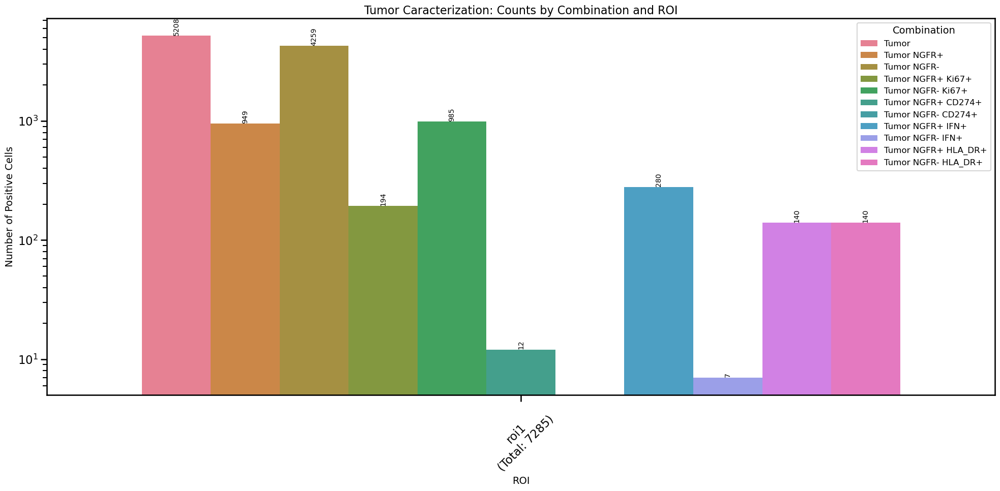

,ROI,Tumor,Tumor NGFR+,Tumor NGFR-,Tumor NGFR+ Ki67+,Tumor NGFR- Ki67+,Tumor NGFR+ CD274+,Tumor NGFR- CD274+,Tumor NGFR+ IFN+,Tumor NGFR- IFN+,Tumor NGFR+ HLA_DR+,Tumor NGFR- HLA_DR+,Total Cells
0,roi1,5208,949,4259,194,985,12,0,280,7,140,140,7285


In [17]:

# ────────────────────────────────────────────────────────────────────────
# Plot cell‐count combinations for tumor caracterization
# ────────────────────────────────────────────────────────────────────────
from multiplex_pipeline.config import (
    CELL_COUNT_OUTPUT_DIR,
    CARACTERIZATION_COMBINATIONS,
    ROIS_TO_ANALYZE
)
from multiplex_pipeline.visualization.qc import plot_combination_counts

counts_df_tumor = plot_combination_counts(
    df=df_binary,
    rois=ROIS_TO_ANALYZE,
    combinations=CARACTERIZATION_COMBINATIONS,
    output_dir=CELL_COUNT_OUTPUT_DIR,
    base_filename="Tumor_Caracterization",
    plot_title="Tumor Caracterization: Counts by Combination and ROI"
)
counts_df_tumor


Table saved as CSV at: results_spatial_analysis\jgagullo\cell_counting\Tumor_Infiltration.csv


\\imgserver.cnio.es\IMAGES\CONFOCAL\IA\CMU\tfm_colab\MultiplexAnalysisProgram\multiplex_pipeline\visualization\qc.py:227: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_lbls, rotation=rotation)


Plot saved as SVG at: results_spatial_analysis\jgagullo\cell_counting\Tumor_Infiltration.svg


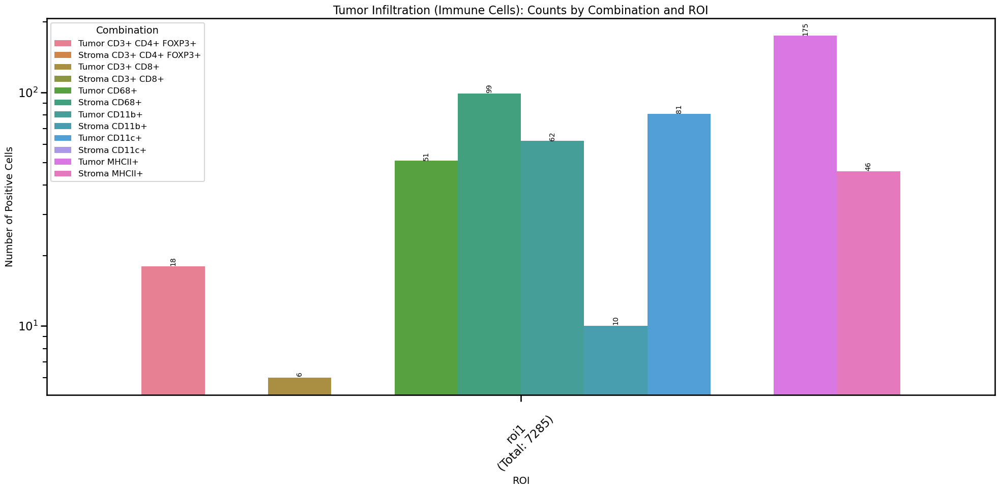

,ROI,Tumor CD3+ CD4+ FOXP3+,Stroma CD3+ CD4+ FOXP3+,Tumor CD3+ CD8+,Stroma CD3+ CD8+,Tumor CD68+,Stroma CD68+,Tumor CD11b+,Stroma CD11b+,Tumor CD11c+,Stroma CD11c+,Tumor MHCII+,Stroma MHCII+,Total Cells
0,roi1,18,0,6,0,51,99,62,10,81,0,175,46,7285


In [18]:
# ────────────────────────────────────────────────────────────────────────
# Plot cell‐count combinations for tumor infiltration
# ────────────────────────────────────────────────────────────────────────
from multiplex_pipeline.config import (
    CELL_COUNT_OUTPUT_DIR,
    INFILTRATION_COMBINATIONS,
    ROIS_TO_ANALYZE
)
from multiplex_pipeline.visualization.qc import plot_combination_counts

counts_df_tumor = plot_combination_counts(
    df=df_binary,
    rois=ROIS_TO_ANALYZE,
    combinations=INFILTRATION_COMBINATIONS,
    output_dir=CELL_COUNT_OUTPUT_DIR,
    base_filename="Tumor_Infiltration",
    plot_title="Tumor Infiltration (Immune Cells): Counts by Combination and ROI"
)
counts_df_tumor


Table saved as CSV at: results_spatial_analysis\jgagullo\cell_counting\Tumor_Infiltration_NGFR.csv


\\imgserver.cnio.es\IMAGES\CONFOCAL\IA\CMU\tfm_colab\MultiplexAnalysisProgram\multiplex_pipeline\visualization\qc.py:227: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_lbls, rotation=rotation)


Plot saved as SVG at: results_spatial_analysis\jgagullo\cell_counting\Tumor_Infiltration_NGFR.svg


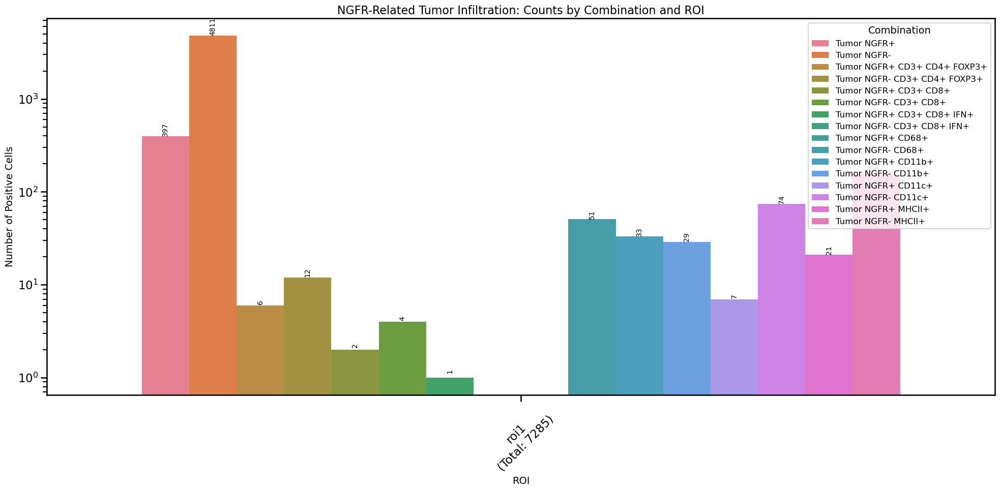

,ROI,Tumor NGFR+,Tumor NGFR-,Tumor NGFR+ CD3+ CD4+ FOXP3+,Tumor NGFR- CD3+ CD4+ FOXP3+,Tumor NGFR+ CD3+ CD8+,Tumor NGFR- CD3+ CD8+,Tumor NGFR+ CD3+ CD8+ IFN+,Tumor NGFR- CD3+ CD8+ IFN+,Tumor NGFR+ CD68+,Tumor NGFR- CD68+,Tumor NGFR+ CD11b+,Tumor NGFR- CD11b+,Tumor NGFR+ CD11c+,Tumor NGFR- CD11c+,Tumor NGFR+ MHCII+,Tumor NGFR- MHCII+,Total Cells
0,roi1,397,4811,6,12,2,4,1,0,0,51,33,29,7,74,21,154,7285


In [19]:
# ────────────────────────────────────────────────────────────────────────
# Plot cell‐count combinations for NGFR‐related infiltration
# ────────────────────────────────────────────────────────────────────────
from multiplex_pipeline.config import NGFR_INFILTRATION_COMBINATIONS

counts_df_ngfr = plot_combination_counts(
    df=df_binary,
    rois=ROIS_TO_ANALYZE,
    combinations=NGFR_INFILTRATION_COMBINATIONS,
    output_dir=CELL_COUNT_OUTPUT_DIR,
    base_filename="Tumor_Infiltration_NGFR",
    plot_title="NGFR-Related Tumor Infiltration: Counts by Combination and ROI"
)
counts_df_ngfr


Marker 'CD3' matched with channel 15
Processing roi1...
ROI roi1: 14 celdas cumplen ['CK_mask-', 'CD3_intensity+']


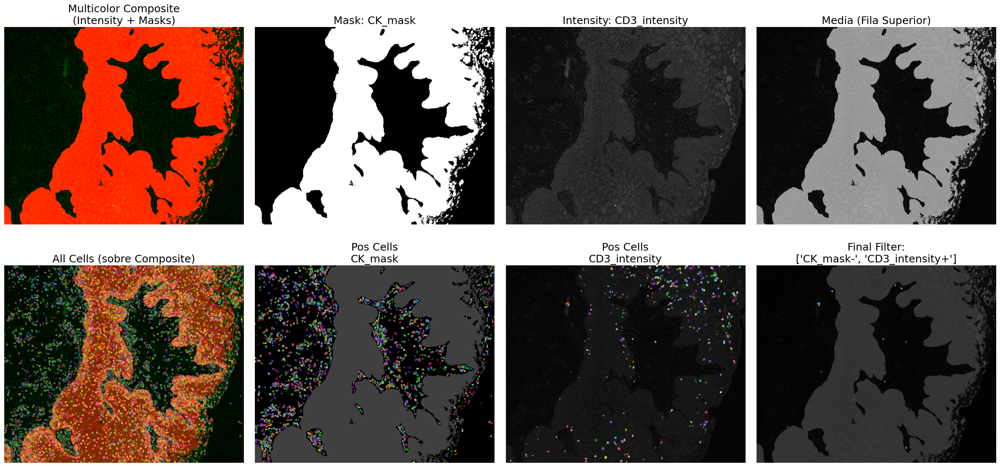

Plot generado para roi1.


In [21]:
# ────────────────────────────────────────────────────────────────────────
# Overlay conditional cell plots (e.g. CK– vs CD3+) using config mappings
# ────────────────────────────────────────────────────────────────────────
from multiplex_pipeline.config import (
    ROIS_TO_ANALYZE,
    MARKER_LABELS,
    CONDITION_COLUMN_MAP,
    DEFAULT_BRIGHTNESS
)
from multiplex_pipeline.visualization.overlays import plot_conditional_cells_channels

conditions = ["CK_mask-", "CD3_intensity+"]

plot_conditional_cells_channels(
    rois=ROIS_TO_ANALYZE,
    conditions=conditions,
    dapi_masks_dict=dapi_masks_dict,
    images_dict=images_dict,
    df_binary=df_binary,
    marker_dict=MARKER_LABELS,          
    ck_masks_dict=ck_masks_dict,
    ngfr_masks_dict=ngfr_masks_dict,
    condition_column_map=CONDITION_COLUMN_MAP,
    brightness_factor=DEFAULT_BRIGHTNESS
)


### Cálculos de areas

In [24]:
# ────────────────────────────────────────────────────────────────────────
# Compute mask area summary (µm²) for CK and NGFR
# ────────────────────────────────────────────────────────────────────────
from multiplex_pipeline.analysis.spatial import compute_mask_area_summary

mask_area_summary = compute_mask_area_summary(ck_masks_dict, ngfr_masks_dict)
mask_area_summary


,ROI,CK_Positive_Area_um2,CK_NGFR_Positive_Area_um2,total_area_roi_um2
0,roi1,1.033104e+06,16881.6749,2074424.66


In [25]:
# ────────────────────────────────────────────────────────────────────────
# Compute cell densities (cells/µm²) per ROI and subpopulation
# ────────────────────────────────────────────────────────────────────────
from multiplex_pipeline.config import (
    SUBPOPULATIONS,
    CONDITION_COLUMN_MAP,
    CELL_DENSITY_OUTPUT_DIR,
    ROIS_TO_ANALYZE
)
from multiplex_pipeline.analysis.spatial import compute_subpop_cells_per_area

for subpop_name, conditions in SUBPOPULATIONS.items():
    # <-- aquí desempaquetamos las DOS salidas
    df_summary, df_formatted = compute_subpop_cells_per_area(
        df_binary=df_binary,
        subpop_conditions=conditions,
        cond_map=CONDITION_COLUMN_MAP,      # antes: condition_column_map
        mask_summary=mask_area_summary,     # antes: mask_area_summary
        rois=ROIS_TO_ANALYZE,               # antes: selected_rois
        out_dir=CELL_DENSITY_OUTPUT_DIR,    # antes: path_save
        roi_col="ROI"
    )
    print(f"— Processed {subpop_name}")
    display(df_summary.head())
    display(df_formatted.head())


Saved: results_spatial_analysis\jgagullo\cell_density_area\cell_density_area_CD3_intensityPos_CD4_intensityPos_FOXP3_intensityPos.csv
— Processed Tregs


,ROI,Subpopulation_Cell_Count,CK_Positive_Area_um2,CK_NGFR_Positive_Area_um2,Cells_per_um2_CK_Positive,Cells_per_um2_CK_NGFR_Positive
0,roi1,18,1.033104e+06,16881.6749,0.000017,0.001066


,ROI,"Subpopulation Cell Count (CD3_intensity+, CD4_intensity+, FOXP3_intensity+)",CK⁺ Area (µm²),CK⁺NGFR⁺ Area (µm²),Cells per µm² (CK⁺),Cells per µm² (CK⁺NGFR⁺)
0,roi1,18,1033103.93,16881.67,0.000017,0.001066


Saved: results_spatial_analysis\jgagullo\cell_density_area\cell_density_area_CD3_intensityPos_CD8a_intensityPos.csv
— Processed T CD8+


,ROI,Subpopulation_Cell_Count,CK_Positive_Area_um2,CK_NGFR_Positive_Area_um2,Cells_per_um2_CK_Positive,Cells_per_um2_CK_NGFR_Positive
0,roi1,6,1.033104e+06,16881.6749,0.000006,0.000355


,ROI,"Subpopulation Cell Count (CD3_intensity+, CD8a_intensity+)",CK⁺ Area (µm²),CK⁺NGFR⁺ Area (µm²),Cells per µm² (CK⁺),Cells per µm² (CK⁺NGFR⁺)
0,roi1,6,1033103.93,16881.67,0.000006,0.000355


Saved: results_spatial_analysis\jgagullo\cell_density_area\cell_density_area_CD3_intensityPos_CD8a_intensityPos_IFN-gamma_intensityPos.csv
— Processed T CD8+ Activator


,ROI,Subpopulation_Cell_Count,CK_Positive_Area_um2,CK_NGFR_Positive_Area_um2,Cells_per_um2_CK_Positive,Cells_per_um2_CK_NGFR_Positive
0,roi1,1,1.033104e+06,16881.6749,9.679568e-07,0.000059


,ROI,"Subpopulation Cell Count (CD3_intensity+, CD8a_intensity+, IFN-gamma_intensity+)",CK⁺ Area (µm²),CK⁺NGFR⁺ Area (µm²),Cells per µm² (CK⁺),Cells per µm² (CK⁺NGFR⁺)
0,roi1,1,1033103.93,16881.67,0.000001,0.000059


Saved: results_spatial_analysis\jgagullo\cell_density_area\cell_density_area_CD68_intensityPos.csv
— Processed Macrophages CD68+


,ROI,Subpopulation_Cell_Count,CK_Positive_Area_um2,CK_NGFR_Positive_Area_um2,Cells_per_um2_CK_Positive,Cells_per_um2_CK_NGFR_Positive
0,roi1,150,1.033104e+06,16881.6749,0.000145,0.008885


,ROI,Subpopulation Cell Count (CD68_intensity+),CK⁺ Area (µm²),CK⁺NGFR⁺ Area (µm²),Cells per µm² (CK⁺),Cells per µm² (CK⁺NGFR⁺)
0,roi1,150,1033103.93,16881.67,0.000145,0.008885


Saved: results_spatial_analysis\jgagullo\cell_density_area\cell_density_area_CD11b_intensityPos.csv
— Processed DC CD11b+


,ROI,Subpopulation_Cell_Count,CK_Positive_Area_um2,CK_NGFR_Positive_Area_um2,Cells_per_um2_CK_Positive,Cells_per_um2_CK_NGFR_Positive
0,roi1,72,1.033104e+06,16881.6749,0.00007,0.004265


,ROI,Subpopulation Cell Count (CD11b_intensity+),CK⁺ Area (µm²),CK⁺NGFR⁺ Area (µm²),Cells per µm² (CK⁺),Cells per µm² (CK⁺NGFR⁺)
0,roi1,72,1033103.93,16881.67,0.000070,0.004265


Saved: results_spatial_analysis\jgagullo\cell_density_area\cell_density_area_CD11c_intensityPos.csv
— Processed DC CD11c+


,ROI,Subpopulation_Cell_Count,CK_Positive_Area_um2,CK_NGFR_Positive_Area_um2,Cells_per_um2_CK_Positive,Cells_per_um2_CK_NGFR_Positive
0,roi1,81,1.033104e+06,16881.6749,0.000078,0.004798


,ROI,Subpopulation Cell Count (CD11c_intensity+),CK⁺ Area (µm²),CK⁺NGFR⁺ Area (µm²),Cells per µm² (CK⁺),Cells per µm² (CK⁺NGFR⁺)
0,roi1,81,1033103.93,16881.67,0.000078,0.004798


Saved: results_spatial_analysis\jgagullo\cell_density_area\cell_density_area_HLA-DR_intensityPos.csv
— Processed DC HLA-DR+


,ROI,Subpopulation_Cell_Count,CK_Positive_Area_um2,CK_NGFR_Positive_Area_um2,Cells_per_um2_CK_Positive,Cells_per_um2_CK_NGFR_Positive
0,roi1,221,1.033104e+06,16881.6749,0.000214,0.013091


,ROI,Subpopulation Cell Count (HLA-DR_intensity+),CK⁺ Area (µm²),CK⁺NGFR⁺ Area (µm²),Cells per µm² (CK⁺),Cells per µm² (CK⁺NGFR⁺)
0,roi1,221,1033103.93,16881.67,0.000214,0.013091


### DISTANCIAS

In [31]:
# ────────────────────────────────────────────────────────────────────────
# Compute distances from each subpopulation to CK / NGFR masks
# ────────────────────────────────────────────────────────────────────────
import os
from multiplex_pipeline.config import (
    DISTANCES_SUBPOP_DIR,
    SUBPOPULATIONS,
    CONDITION_COLUMN_MAP,
    ROIS_TO_ANALYZE
)
from multiplex_pipeline.visualization.overlays import compute_and_save

# For each defined sub‐population and each ROI, compute & save distance figures + CSVs
for subpop_name, subpop_conditions in SUBPOPULATIONS.items():
    for roi in ROIS_TO_ANALYZE:
        compute_and_save(
            roi=roi,
            subpop_name=subpop_name,
            subpop_conditions=subpop_conditions,
            path_save=DISTANCES_SUBPOP_DIR,
            dapi_masks=dapi_masks_dict,
            ck_masks=ck_masks_dict,
            ngfr_masks=ngfr_masks_dict,
            df_bin=df_binary,
            col_map=CONDITION_COLUMN_MAP,
            max_cells=None
        )



KeyboardInterrupt



Error in callback <function _draw_all_if_interactive at 0x000001D36320DC60> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



Error in callback <function flush_figures at 0x000001D3659C09A0> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



Reading CSVs in DC CD11b+: 100%|██████████████████████████████████████████████████████| 1/1 [00:00<00:00, 250.06file/s]

Reading CSVs in DC CD11c+: 100%|██████████████████████████████████████████████████████| 1/1 [00:00<00:00, 250.08file/s]

Reading CSVs in DC HLA-DR+: 100%|█████████████████████████████████████████████████████| 1/1 [00:00<00:00, 249.94file/s]

Reading CSVs in Macrophages CD68+: 100%|██████████████████████████████████████████████| 1/1 [00:00<00:00, 250.02file/s]

Reading CSVs in T CD8+: 100%|█████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 332.75file/s]

Reading CSVs in T CD8+ Activator: 100%|███████████████████████████████████████████████| 1/1 [00:00<00:00, 200.00file/s]

Loading CSV subfolders: 100%|██████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 122.74dir/s]


Guardado: results_spatial_analysis\jgagullo\boxplots_distances_to_mask\mask2subpop_DC CD11b+.svg


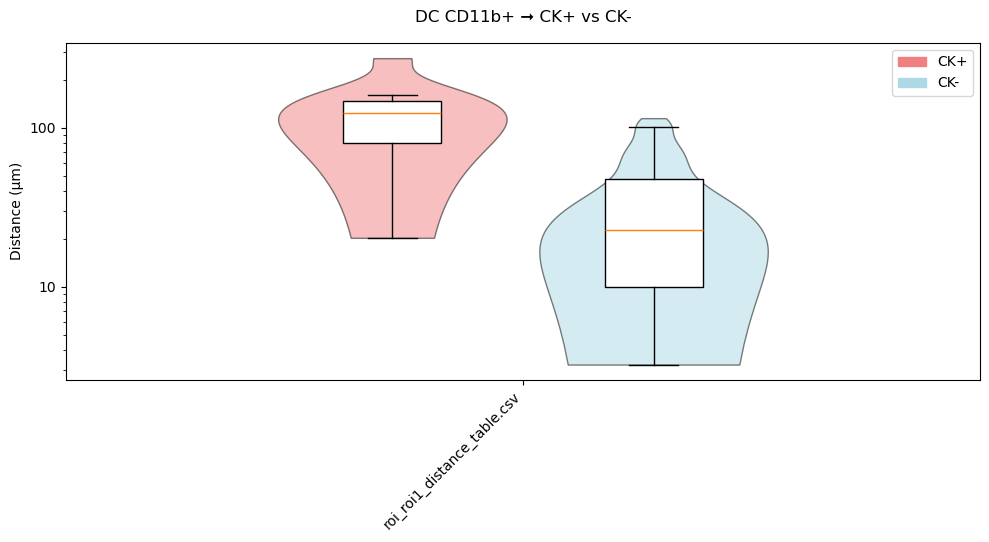

Guardado: results_spatial_analysis\jgagullo\boxplots_distances_to_mask\mask2subpop_DC CD11c+.svg


C:\Users\Confocal\anaconda3\Lib\site-packages\numpy\linalg\linalg.py:2180: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)


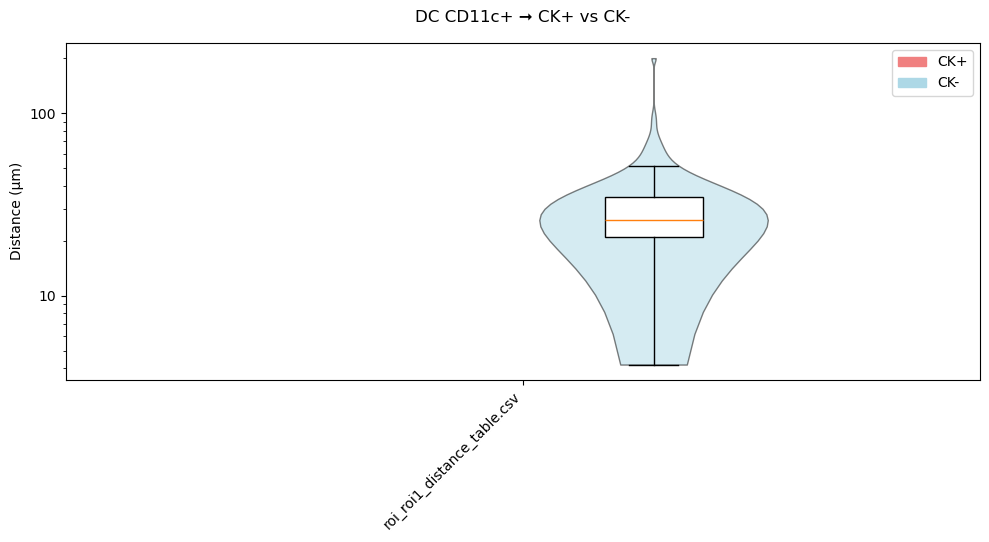

Guardado: results_spatial_analysis\jgagullo\boxplots_distances_to_mask\mask2subpop_DC HLA-DR+.svg


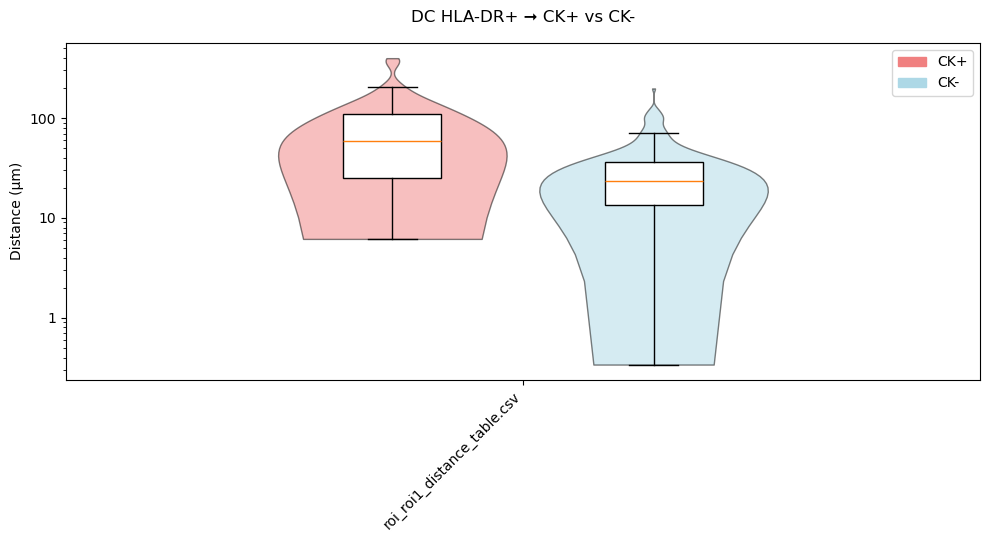

Guardado: results_spatial_analysis\jgagullo\boxplots_distances_to_mask\mask2subpop_Macrophages CD68+.svg


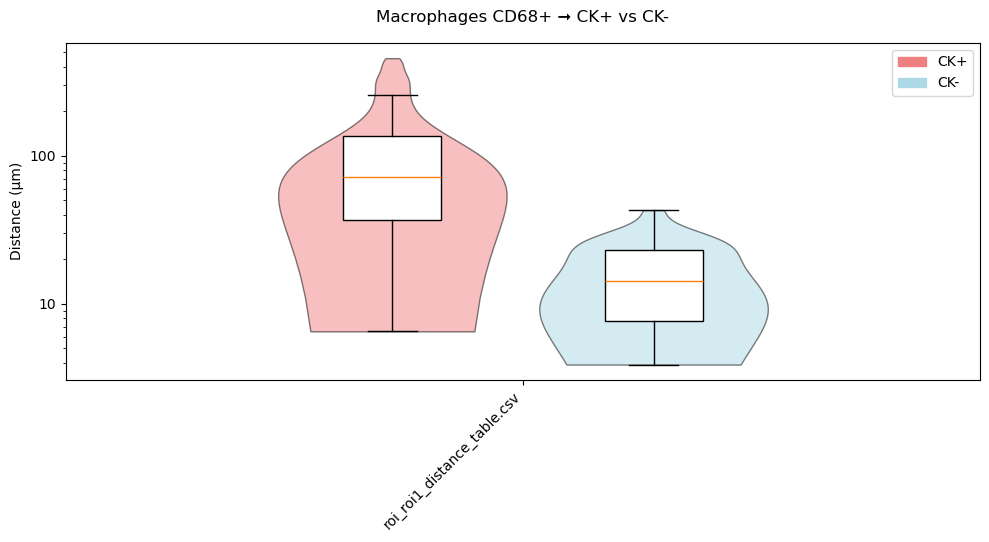

C:\Users\Confocal\anaconda3\Lib\site-packages\numpy\linalg\linalg.py:2180: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)


Guardado: results_spatial_analysis\jgagullo\boxplots_distances_to_mask\mask2subpop_T CD8+.svg


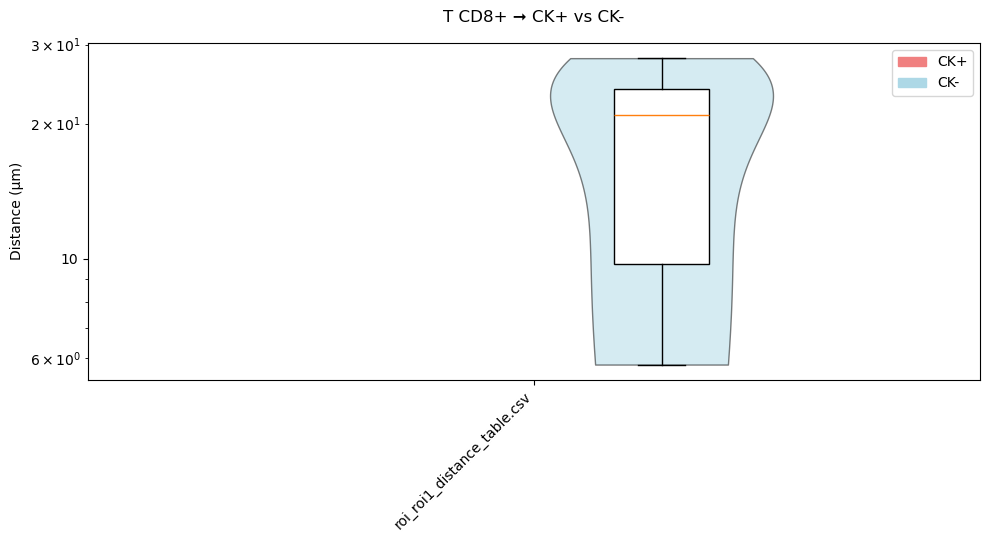

Guardado: results_spatial_analysis\jgagullo\boxplots_distances_to_mask\mask2subpop_T CD8+ Activator.svg


C:\Users\Confocal\anaconda3\Lib\site-packages\numpy\linalg\linalg.py:2180: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)


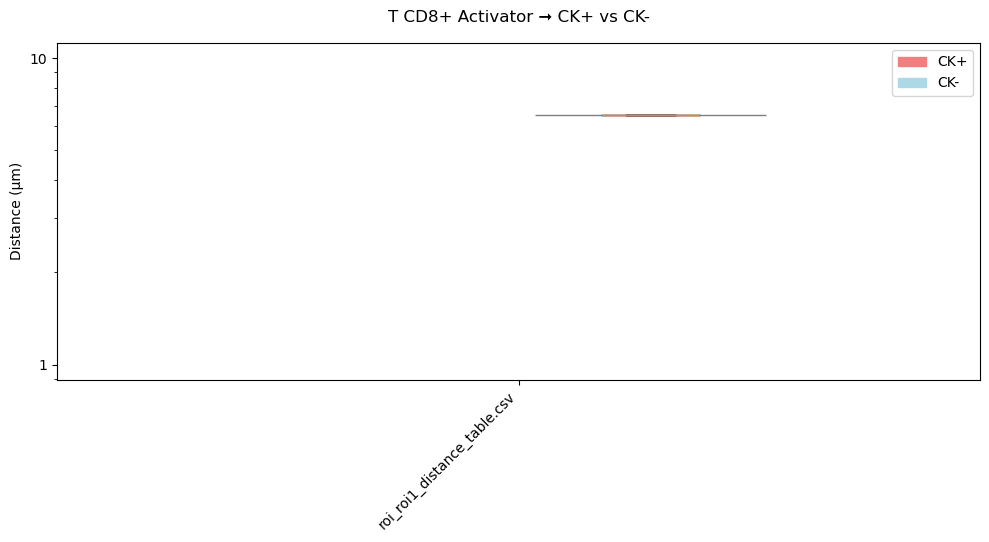

C:\Users\Confocal\anaconda3\Lib\site-packages\numpy\linalg\linalg.py:2180: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)


Guardado: results_spatial_analysis\jgagullo\boxplots_distances_to_mask\mask2subpop_Tregs.svg


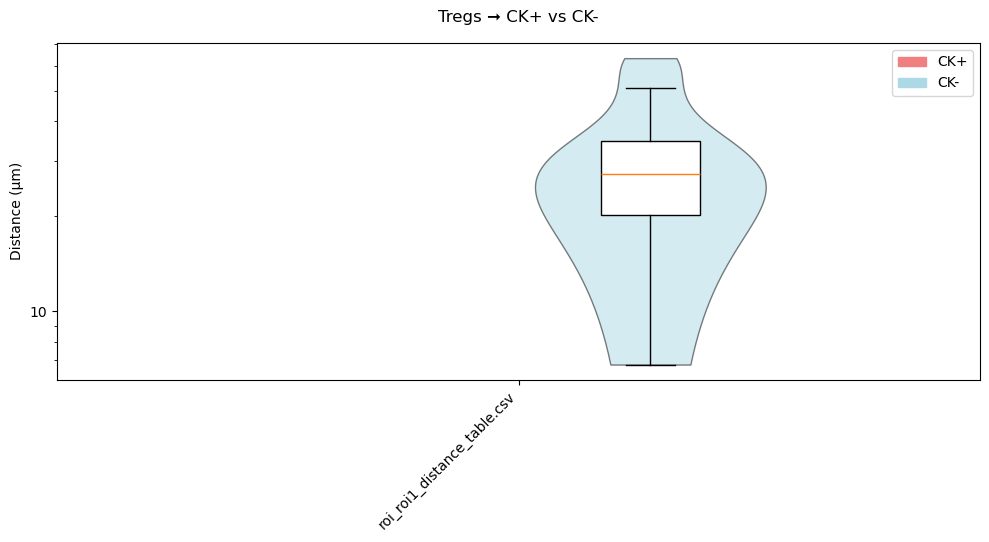

C:\Users\Confocal\anaconda3\Lib\site-packages\numpy\linalg\linalg.py:2180: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)


Invirtiendo: subpop DC CD11b+ para ROI roi_roi1_distance_table.csv
Invirtiendo: subpop DC CD11c+ para ROI roi_roi1_distance_table.csv
Invirtiendo: subpop DC HLA-DR+ para ROI roi_roi1_distance_table.csv
Invirtiendo: subpop Macrophages CD68+ para ROI roi_roi1_distance_table.csv
Invirtiendo: subpop T CD8+ para ROI roi_roi1_distance_table.csv
Invirtiendo: subpop T CD8+ Activator para ROI roi_roi1_distance_table.csv
Invirtiendo: subpop Tregs para ROI roi_roi1_distance_table.csv
Guardado: results_spatial_analysis\jgagullo\boxplots_distances_to_mask\mask2subpop_byROI_roi_roi1_distance_table.csv.svg


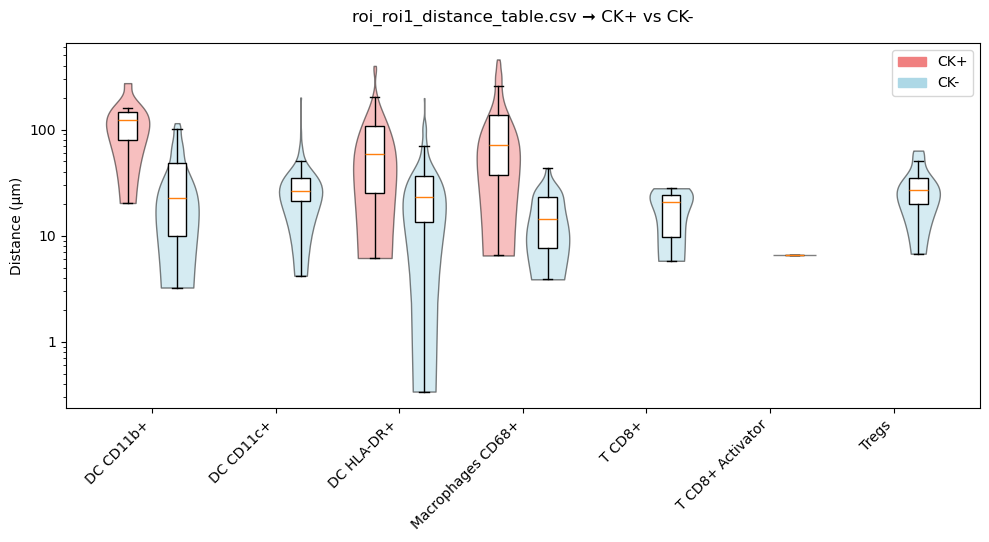

In [10]:
%matplotlib inline

from multiplex_pipeline.config import BOXPLOTS_DISTANCES_DIR, DISTANCES_SUBPOP_DIR
from multiplex_pipeline.io.loaders import load_csv_data
from multiplex_pipeline.visualization.qc import generate_boxplots_nested
from multiplex_pipeline.utils.helpers import invert_dict

# 1) Carga datos
subpop_data = load_csv_data(DISTANCES_SUBPOP_DIR)

# 2) Por subpoblación
generate_boxplots_nested(
    nested_data=subpop_data,
    positive_col="distance_ck_positive",
    negative_col="distance_ck_negative",
    label="CK",
    output_dir=BOXPLOTS_DISTANCES_DIR,
    prefix="mask2subpop"
)

# 3) Invertido (por ROI)
roi_data = invert_dict(subpop_data)
generate_boxplots_nested(
    nested_data=roi_data,
    positive_col="distance_ck_positive",
    negative_col="distance_ck_negative",
    label="CK",
    output_dir=BOXPLOTS_DISTANCES_DIR,
    prefix="mask2subpop_byROI"
)


## heatmaps


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity+
columns: CD3_intensity+_CD4_intensity+_FOXP3_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\Tregs\distance_matrix_roi1_CK_mask+_NGFR_intensity+_vs_CD3_intensity+_CD4_intensity+_FOXP3_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\Tregs\plot_roi1_CK_mask+_NGFR_intensity+_vs_CD3_intensity+_CD4_intensity+_FOXP3_intensity+.svg


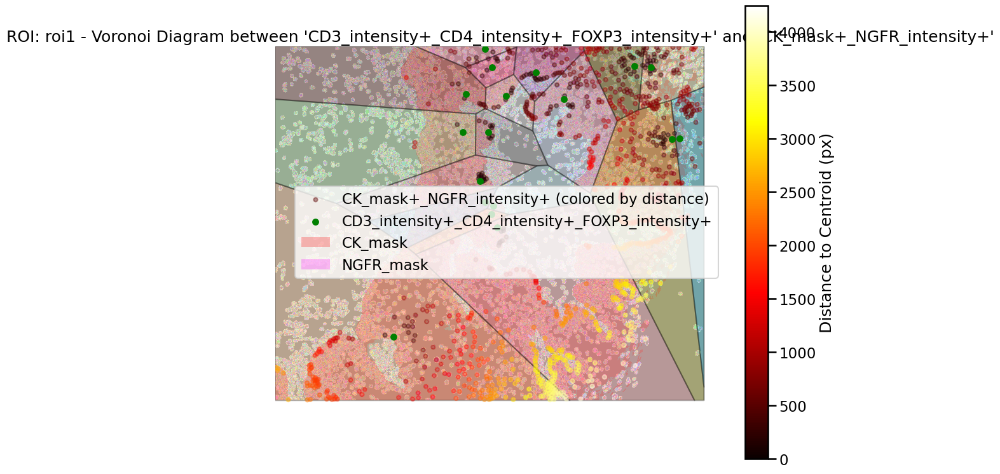


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity+
columns: CD3_intensity+_CD8a_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\T CD8+\distance_matrix_roi1_CK_mask+_NGFR_intensity+_vs_CD3_intensity+_CD8a_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\T CD8+\plot_roi1_CK_mask+_NGFR_intensity+_vs_CD3_intensity+_CD8a_intensity+.svg


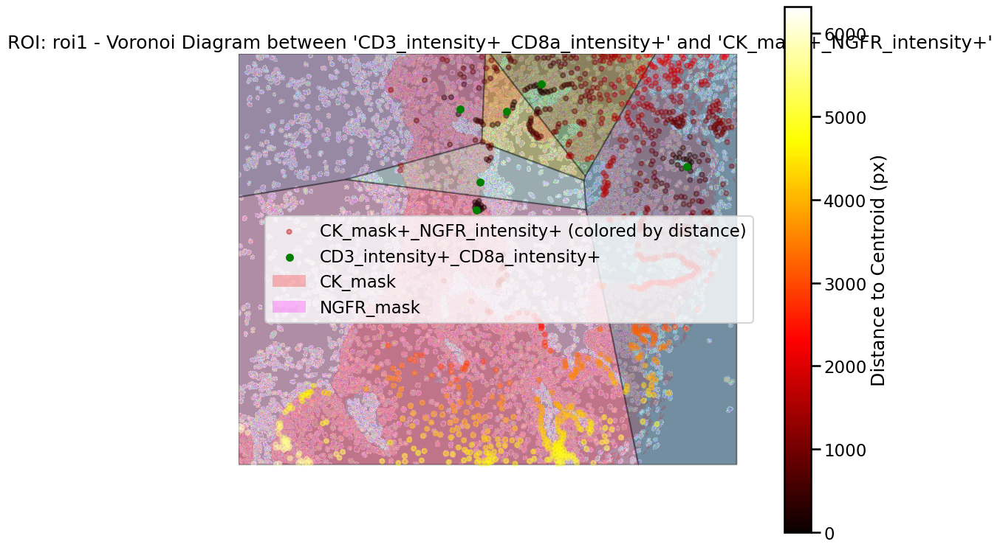


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity+
columns: CD3_intensity+_CD8a_intensity+_IFN-gamma_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\T CD8+ Activator\distance_matrix_roi1_CK_mask+_NGFR_intensity+_vs_CD3_intensity+_CD8a_intensity+_IFN-gamma_intensity+.csv
Error generating Voronoi diagram: QH6214 qhull input error: not enough points(1) to construct initial simplex (need 4)

While executing:  | qhull v Qz Qc Qbb
Options selected for Qhull 2019.1.r 2019/06/21:
  run-id 496085877  voronoi  Qz-infinity-point  Qcoplanar-keep  Qbbound-last
  _pre-merge  _zero-centrum  Qinterior-keep  _maxoutside  0

Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\T CD8+ Activator\plot_roi1_CK_mask+_NGFR_intensity+_vs_CD3_intensity+_CD8a_intensity+_IFN-gamma_intensity+.svg


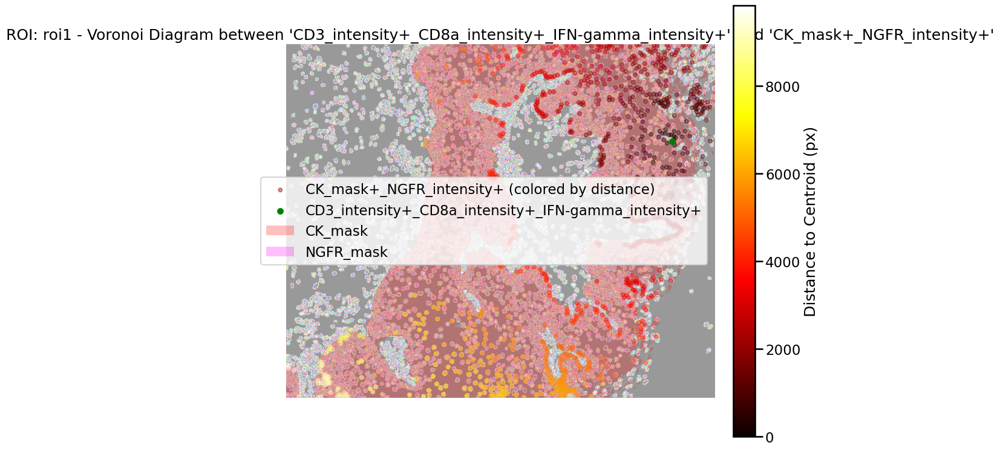


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity+
columns: CD68_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\Macrophages CD68+\distance_matrix_roi1_CK_mask+_NGFR_intensity+_vs_CD68_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\Macrophages CD68+\plot_roi1_CK_mask+_NGFR_intensity+_vs_CD68_intensity+.svg


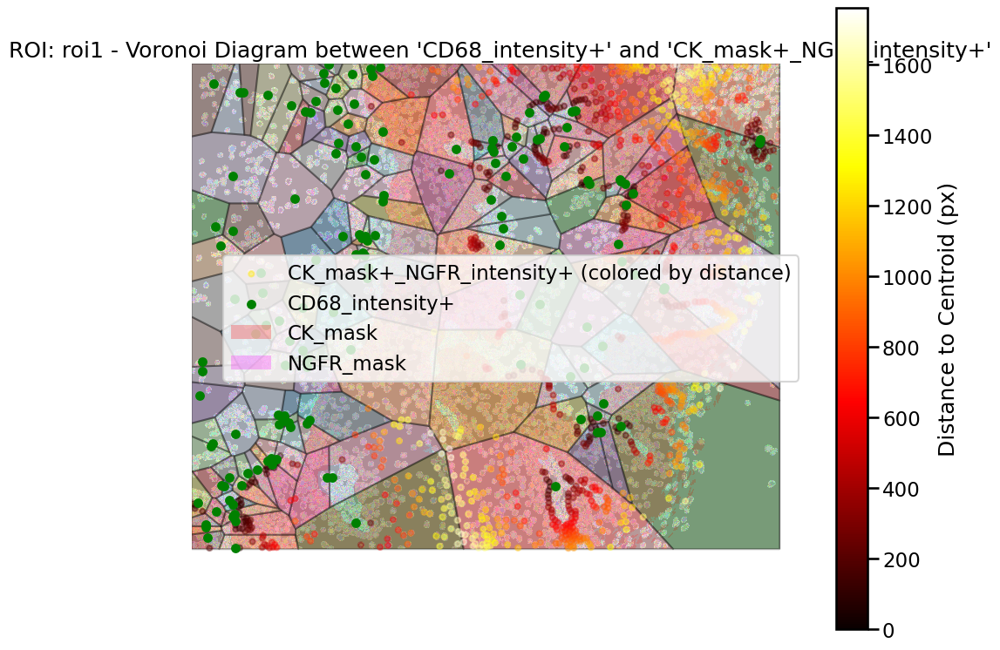


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity+
columns: CD11b_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\DC CD11b+\distance_matrix_roi1_CK_mask+_NGFR_intensity+_vs_CD11b_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\DC CD11b+\plot_roi1_CK_mask+_NGFR_intensity+_vs_CD11b_intensity+.svg


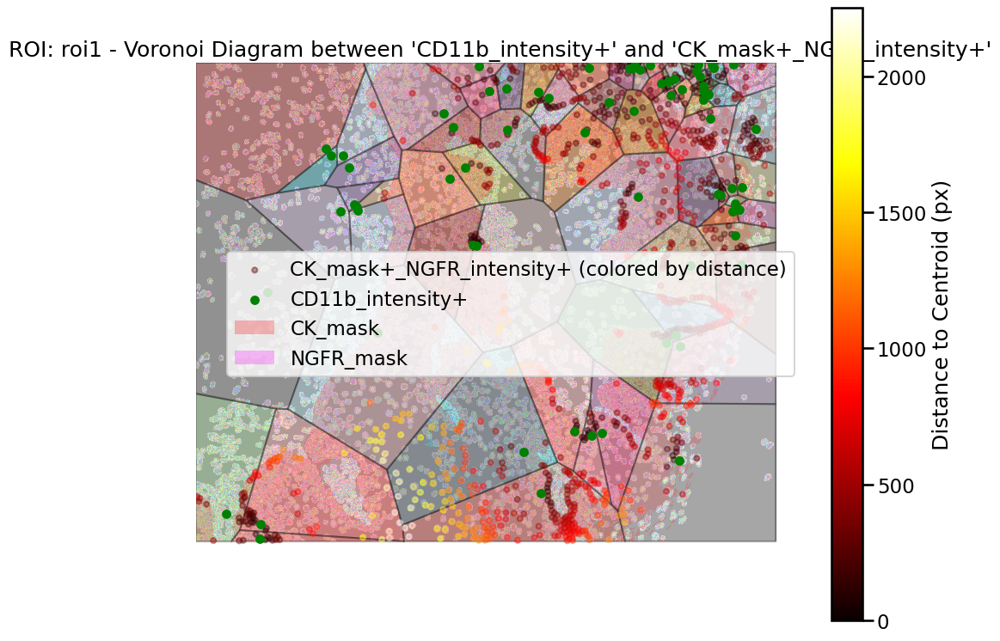


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity+
columns: CD11c_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\DC CD11c+\distance_matrix_roi1_CK_mask+_NGFR_intensity+_vs_CD11c_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\DC CD11c+\plot_roi1_CK_mask+_NGFR_intensity+_vs_CD11c_intensity+.svg


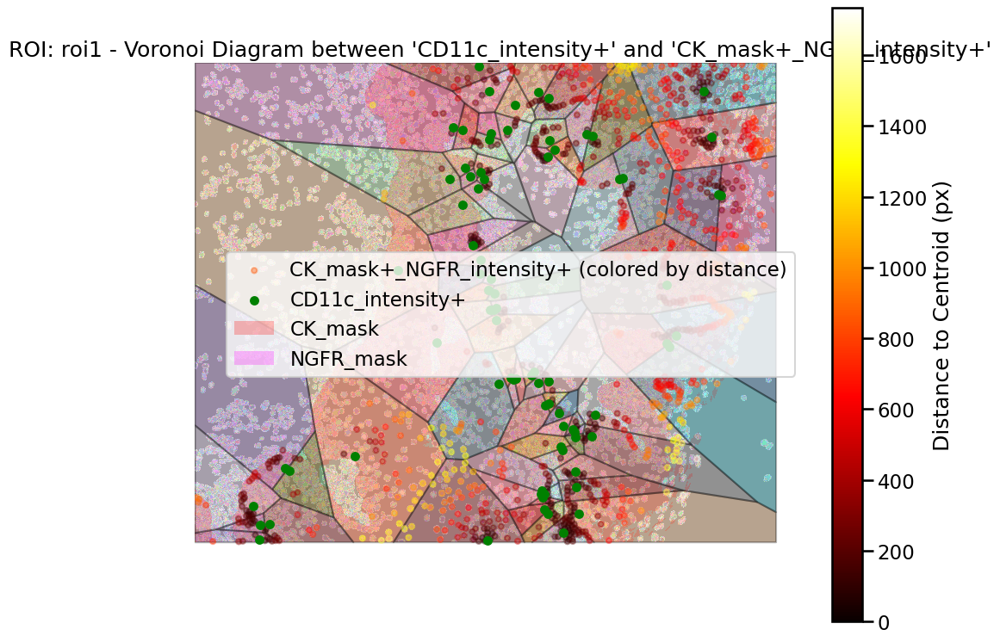


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity+
columns: HLA-DR_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\DC HLA-DR+\distance_matrix_roi1_CK_mask+_NGFR_intensity+_vs_HLA-DR_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\DC HLA-DR+\plot_roi1_CK_mask+_NGFR_intensity+_vs_HLA-DR_intensity+.svg


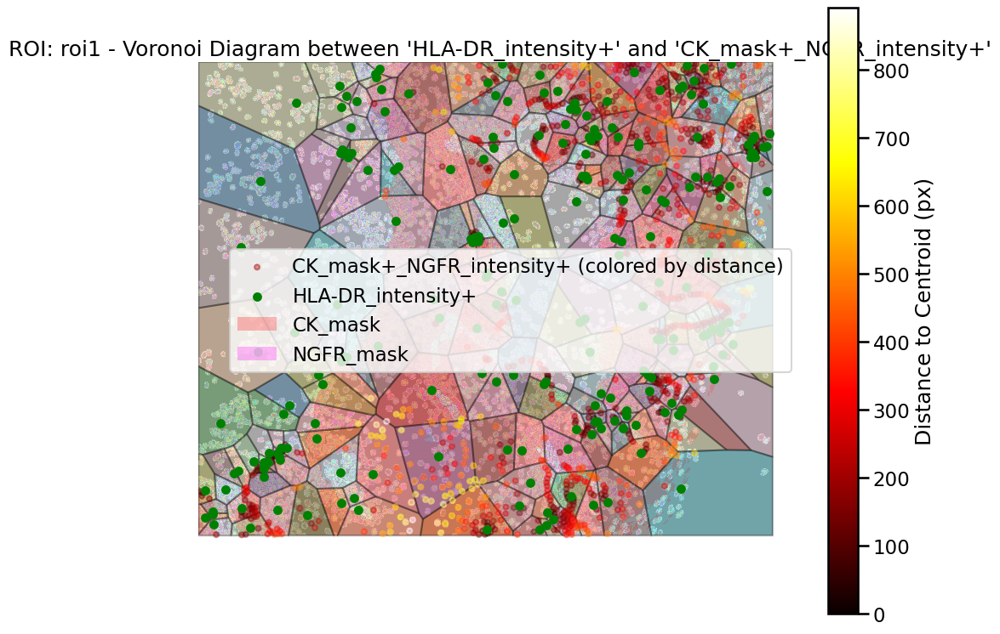


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity-
columns: CD3_intensity+_CD4_intensity+_FOXP3_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\Tregs\distance_matrix_roi1_CK_mask+_NGFR_intensity-_vs_CD3_intensity+_CD4_intensity+_FOXP3_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\Tregs\plot_roi1_CK_mask+_NGFR_intensity-_vs_CD3_intensity+_CD4_intensity+_FOXP3_intensity+.svg


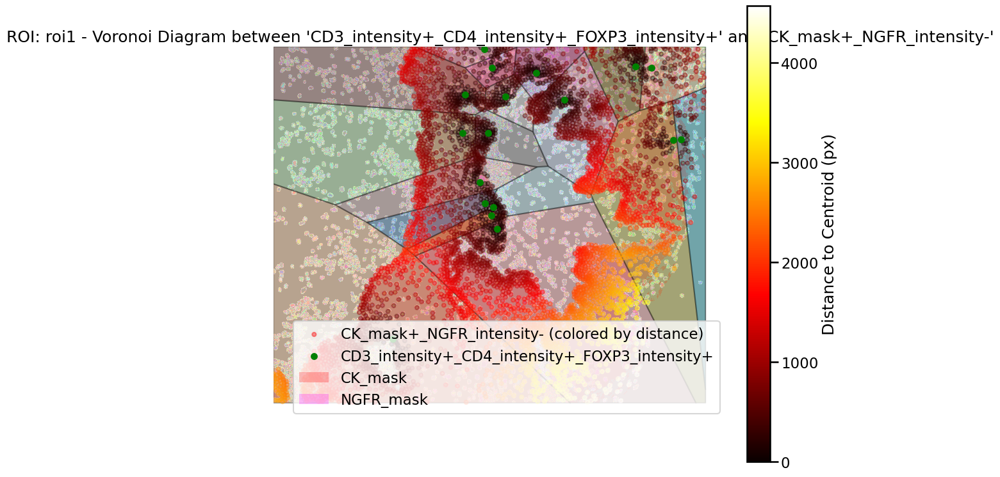


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity-
columns: CD3_intensity+_CD8a_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\T CD8+\distance_matrix_roi1_CK_mask+_NGFR_intensity-_vs_CD3_intensity+_CD8a_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\T CD8+\plot_roi1_CK_mask+_NGFR_intensity-_vs_CD3_intensity+_CD8a_intensity+.svg


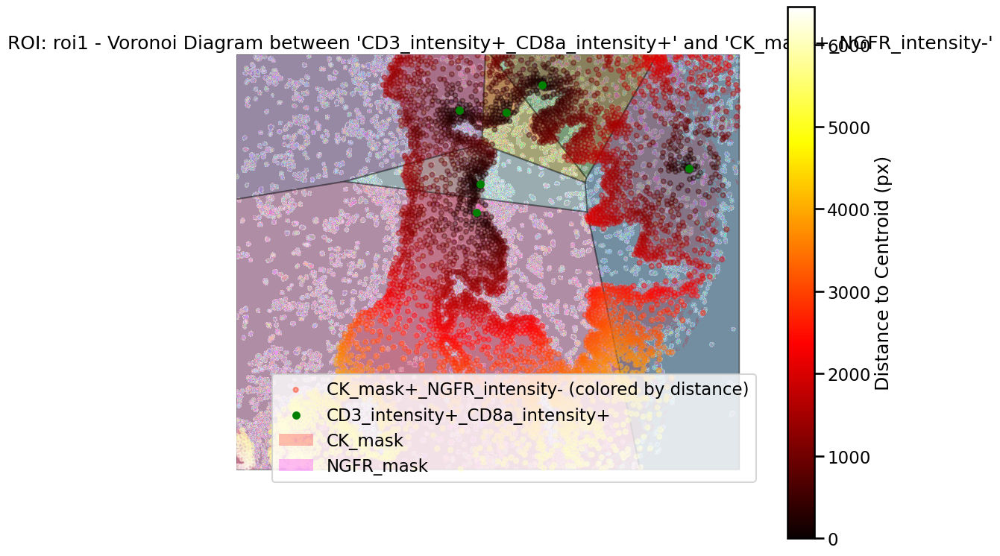


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity-
columns: CD3_intensity+_CD8a_intensity+_IFN-gamma_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\T CD8+ Activator\distance_matrix_roi1_CK_mask+_NGFR_intensity-_vs_CD3_intensity+_CD8a_intensity+_IFN-gamma_intensity+.csv
Error generating Voronoi diagram: QH6214 qhull input error: not enough points(1) to construct initial simplex (need 4)

While executing:  | qhull v Qz Qc Qbb
Options selected for Qhull 2019.1.r 2019/06/21:
  run-id 497867419  voronoi  Qz-infinity-point  Qcoplanar-keep  Qbbound-last
  _pre-merge  _zero-centrum  Qinterior-keep  _maxoutside  0

Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\T CD8+ Activator\plot_roi1_CK_mask+_NGFR_intensity-_vs_CD3_intensity+_CD8a_intensity+_IFN-gamma_intensity+.svg


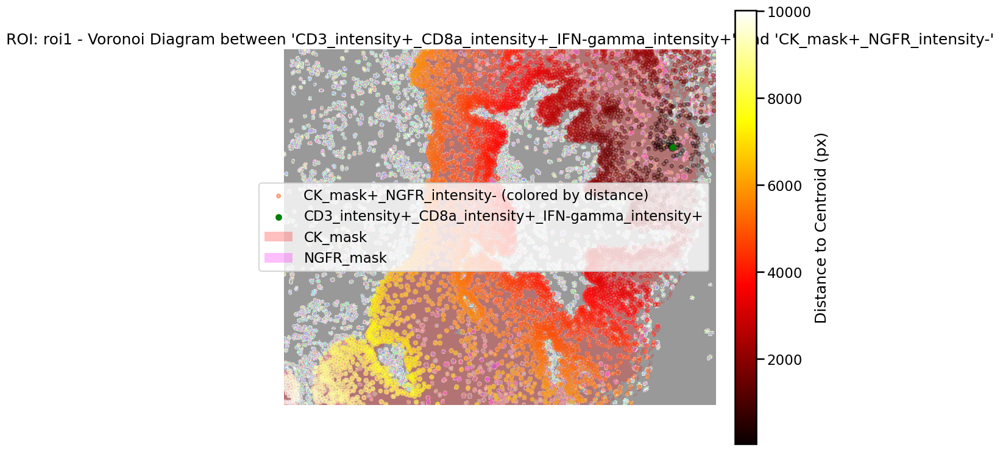


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity-
columns: CD68_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\Macrophages CD68+\distance_matrix_roi1_CK_mask+_NGFR_intensity-_vs_CD68_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\Macrophages CD68+\plot_roi1_CK_mask+_NGFR_intensity-_vs_CD68_intensity+.svg


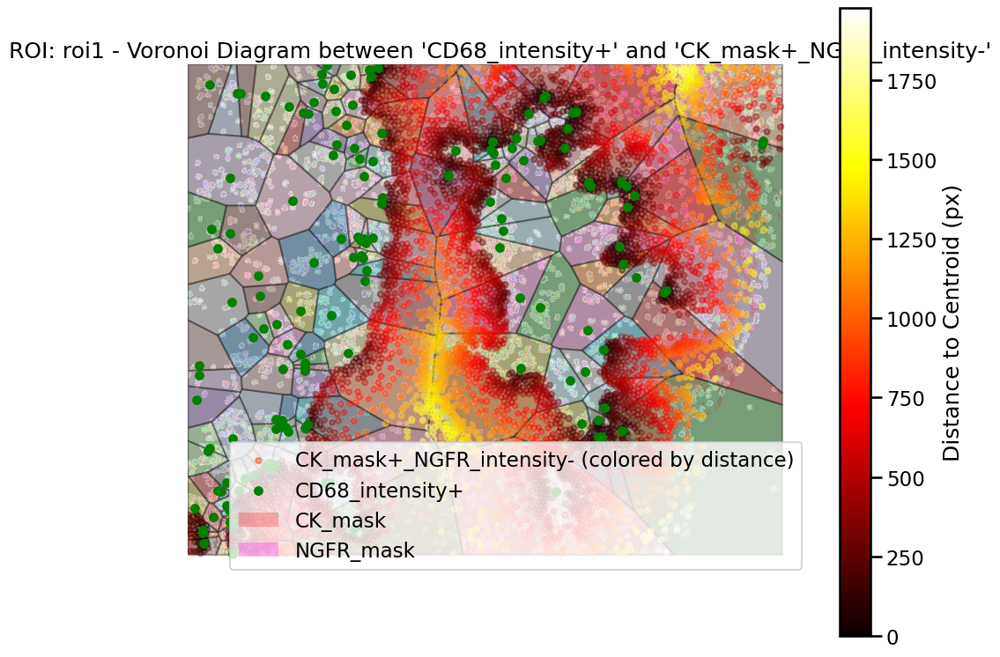


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity-
columns: CD11b_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\DC CD11b+\distance_matrix_roi1_CK_mask+_NGFR_intensity-_vs_CD11b_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\DC CD11b+\plot_roi1_CK_mask+_NGFR_intensity-_vs_CD11b_intensity+.svg


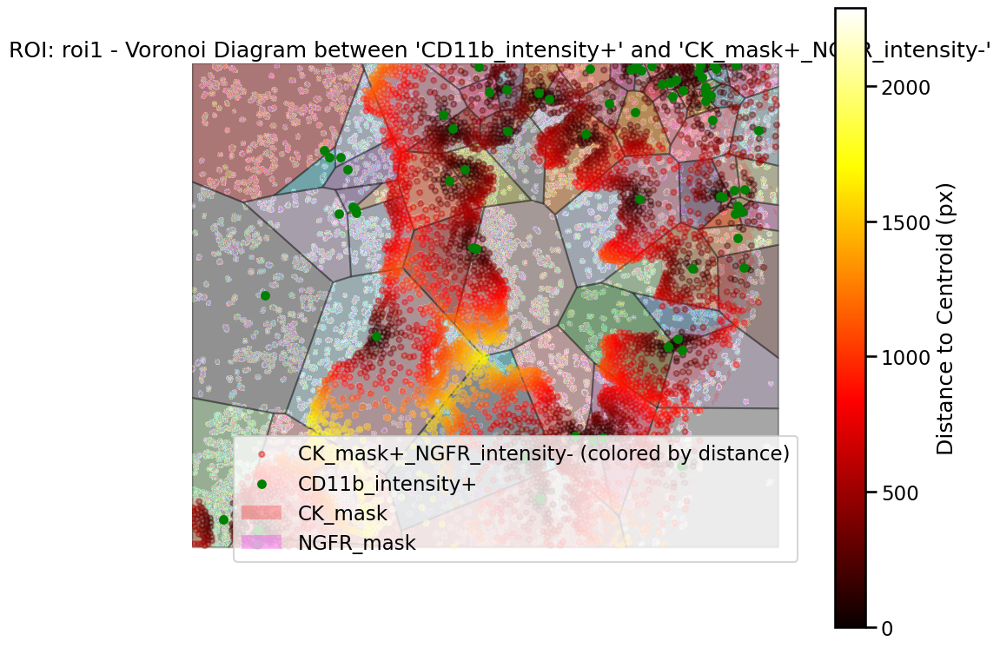


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity-
columns: CD11c_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\DC CD11c+\distance_matrix_roi1_CK_mask+_NGFR_intensity-_vs_CD11c_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\DC CD11c+\plot_roi1_CK_mask+_NGFR_intensity-_vs_CD11c_intensity+.svg


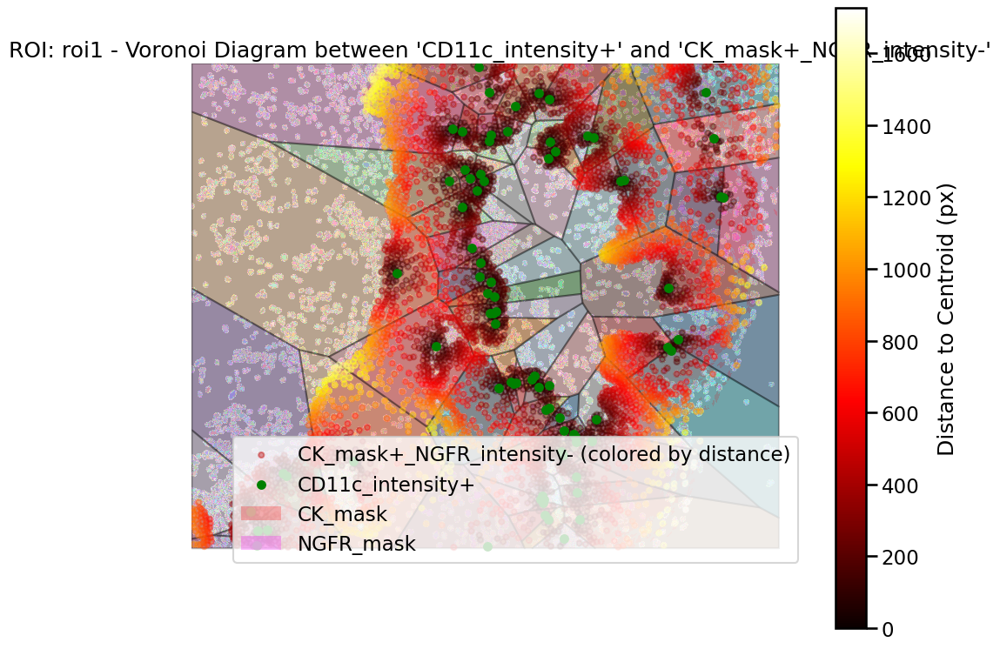


=== ROI roi1 ===
rows: CK_mask+_NGFR_intensity-
columns: HLA-DR_intensity+
Matrix saved as CSV: results_spatial_analysis\jgagullo\distances_between_populations\DC HLA-DR+\distance_matrix_roi1_CK_mask+_NGFR_intensity-_vs_HLA-DR_intensity+.csv
Plot saved as SVG: results_spatial_analysis\jgagullo\distances_between_populations\DC HLA-DR+\plot_roi1_CK_mask+_NGFR_intensity-_vs_HLA-DR_intensity+.svg


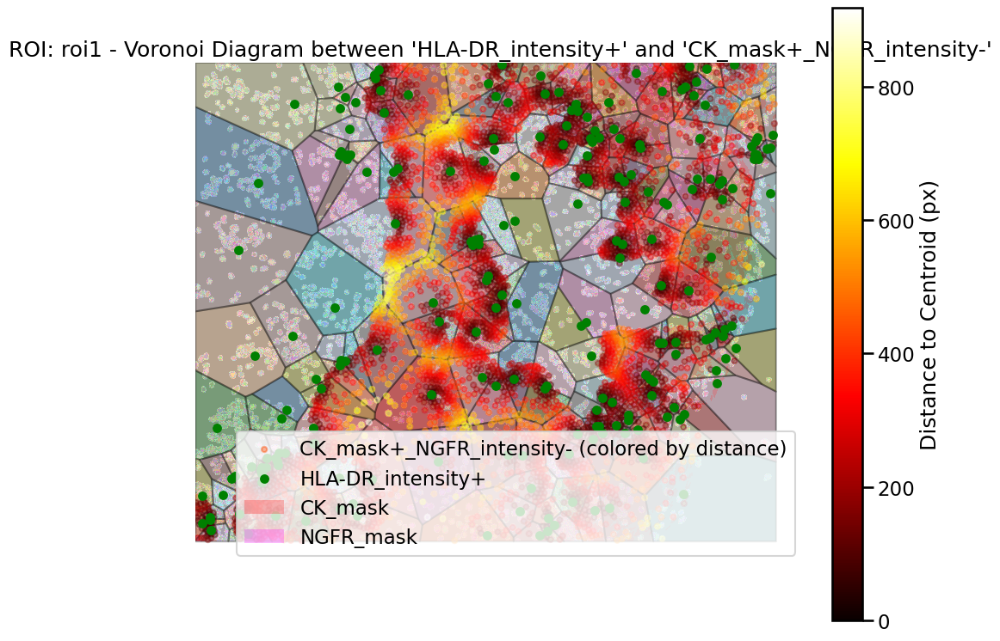

In [32]:
import os
from multiplex_pipeline.config import (
    DISTANCES_POPULATIONS_DIR,
    SUBPOPULATION_A_POSITIVE,
    SUBPOPULATION_A_NEGATIVE,
    SUBPOPULATIONS,
    CONDITION_COLUMN_MAP,
    SHADING_COLORS,
    PIXEL_SIZE,
    ROIS_TO_ANALYZE
)

# Construir un diccionario de sombreado con (mask_dict, color) por cada máscara
mask_dicts = {
    "CK_mask":   ck_masks_dict,
    "NGFR_mask": ngfr_masks_dict
}
shading_dict  = {
    mask_name: (mask_dicts[mask_name], color)
    for mask_name, color in SHADING_COLORS.items()
}
masks_to_shade = list(shading_dict.keys())

# A = CK+ & NGFR+
subpopA = SUBPOPULATION_A_POSITIVE
for subpopB_label, subpopB_conditions in SUBPOPULATIONS.items():
    for roi in ROIS_TO_ANALYZE:
        # Crear el nombre simplificado para la ruta de guardado
        subpopA_name = "_".join(subpopA)  # Nombre de la subpoblación A sin condiciones adicionales
        subpopB_name = subpopB_label  # Nombre de la subpoblación B

        # Crear la ruta de guardado utilizando solo el nombre de la subpoblación (por ejemplo, "Tregs")
        path_save = os.path.join(DISTANCES_POPULATIONS_DIR, f"{subpopB_name}")  # Usamos solo subpopB_name

        # Asegurarnos de que la carpeta exista antes de guardar
        os.makedirs(path_save, exist_ok=True)  # Crea el directorio si no existe

        # Llamar a la función para calcular y guardar las distancias
        compute_and_plot_subpop_distances_for_all_rois(
            rois=[roi],  # Analiza solo un ROI a la vez
            subpop_conditions_A=subpopA,
            subpop_conditions_B=subpopB_conditions,
            df_binary=df_binary,
            dapi_masks_dict=dapi_masks_dict,
            condition_column_map=CONDITION_COLUMN_MAP,
            pixel_size=PIXEL_SIZE,
            max_pairs=None,
            masks_to_shade=masks_to_shade,
            shading_dict=shading_dict,
            save_matrix_as_csv=True,
            path_save=path_save,  # Guardar en la ruta simplificada sin subdirectorios adicionales
            print_pivot_head=False,
            plot_type="voronoi"
        )

# A = CK+ & NGFR-
subpopA = SUBPOPULATION_A_NEGATIVE
for subpopB_label, subpopB_conditions in SUBPOPULATIONS.items():
    for roi in ROIS_TO_ANALYZE:
        # Crear el nombre simplificado para la ruta de guardado
        subpopA_name = "_".join(subpopA)  # Nombre de la subpoblación A sin condiciones adicionales
        subpopB_name = subpopB_label  # Nombre de la subpoblación B

        # Crear la ruta de guardado utilizando solo el nombre de la subpoblación (por ejemplo, "Tregs")
        path_save = os.path.join(DISTANCES_POPULATIONS_DIR, f"{subpopB_name}")  # Usamos solo subpopB_name

        # Asegurarnos de que la carpeta exista antes de guardar
        os.makedirs(path_save, exist_ok=True)  # Crea el directorio si no existe

        # Llamar a la función para calcular y guardar las distancias
        compute_and_plot_subpop_distances_for_all_rois(
            rois=[roi],  # Analiza solo un ROI a la vez
            subpop_conditions_A=subpopA,
            subpop_conditions_B=subpopB_conditions,
            df_binary=df_binary,
            dapi_masks_dict=dapi_masks_dict,
            condition_column_map=CONDITION_COLUMN_MAP,
            pixel_size=PIXEL_SIZE,
            max_pairs=None,
            masks_to_shade=masks_to_shade,
            shading_dict=shading_dict,
            save_matrix_as_csv=True,
            path_save=path_save,  # Guardar en la ruta simplificada sin subdirectorios adicionales
            print_pivot_head=False,
            plot_type="voronoi"
        )


Loading CSV subfolders:   0%|                                                                   | 0/8 [00:00<?, ?dir/s]
Reading CSVs in A_neg: 0file [00:00, ?file/s]

Reading CSVs in DC CD11b+: 100%|███████████████████████████████████████████████████████| 2/2 [00:00<00:00, 31.53file/s]

Reading CSVs in DC HLA-DR+: 100%|██████████████████████████████████████████████████████| 2/2 [00:00<00:00,  4.50file/s]

Reading CSVs in Macrophages CD68+: 100%|███████████████████████████████████████████████| 2/2 [00:00<00:00, 13.99file/s]

Reading CSVs in T CD8+ Activator: 100%|████████████████████████████████████████████████████████| 2/2 [00:00<?, ?file/s]

Loading CSV subfolders: 100%|███████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.73dir/s]


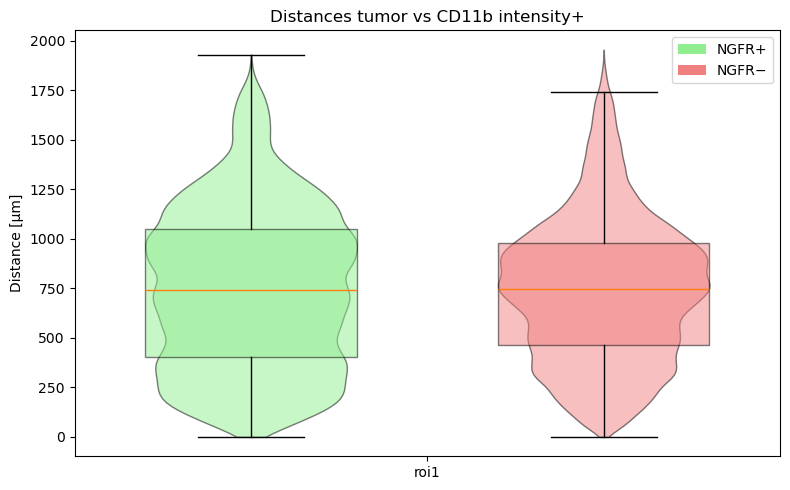

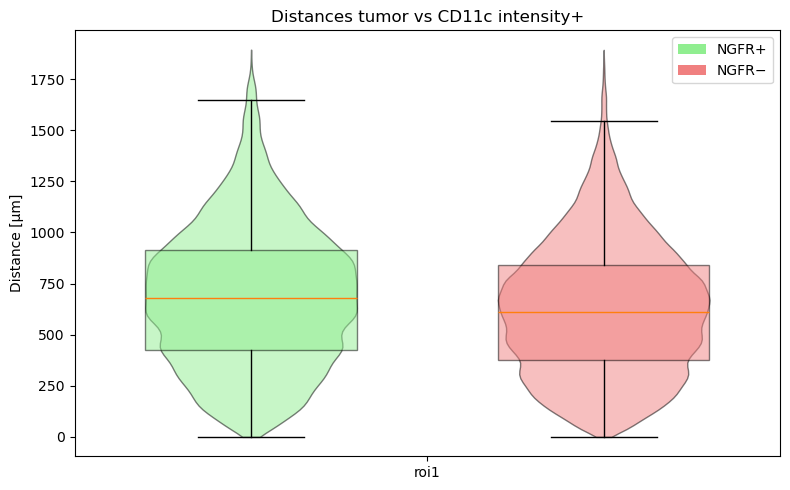

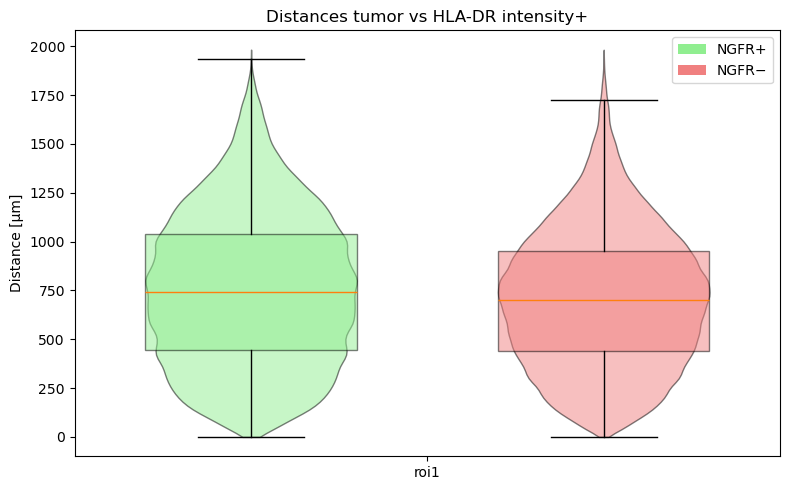

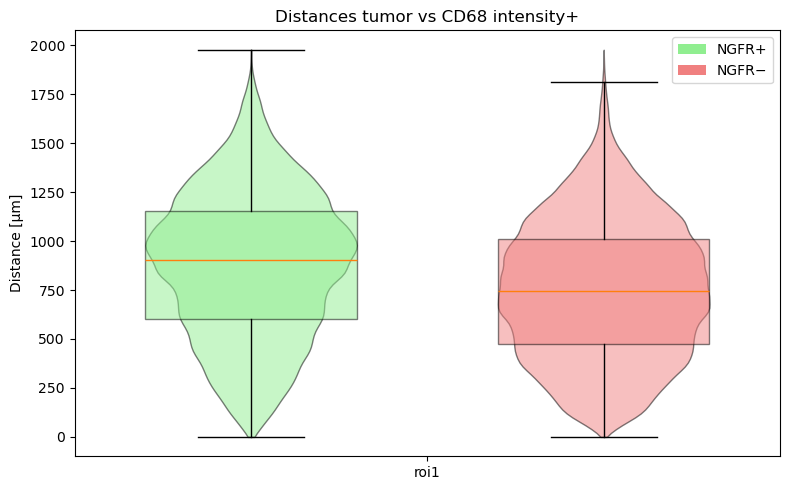

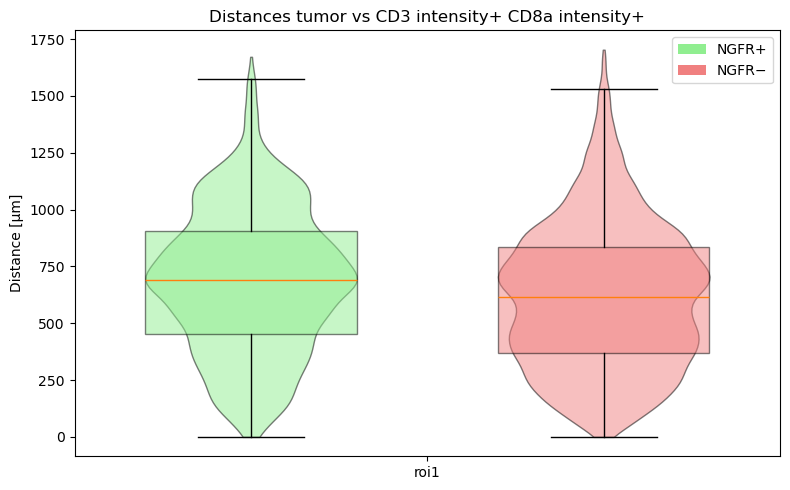

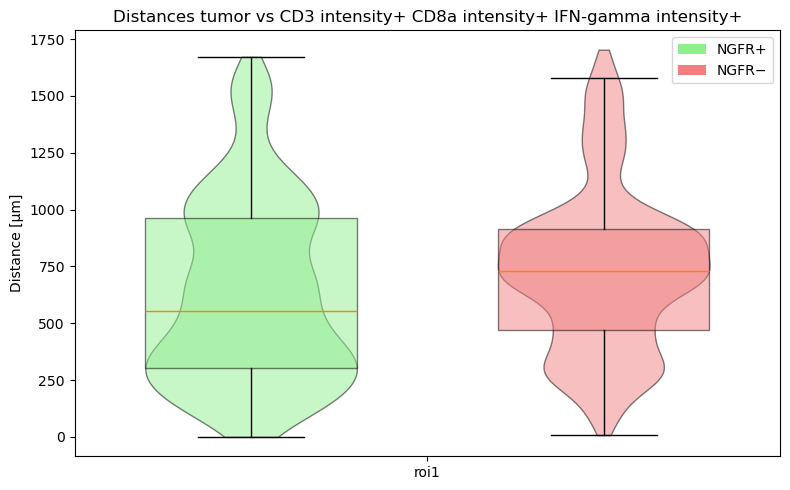

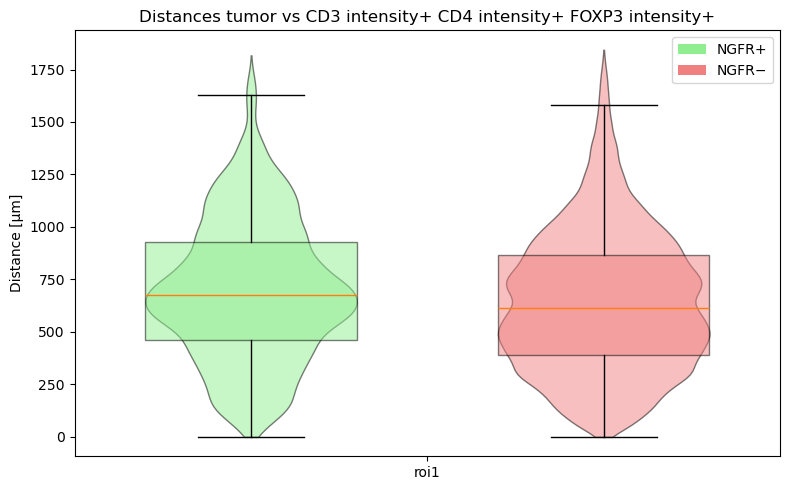

\\imgserver.cnio.es\IMAGES\CONFOCAL\IA\CMU\tfm_colab\MultiplexAnalysisProgram\multiplex_pipeline\visualization\qc.py:291: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


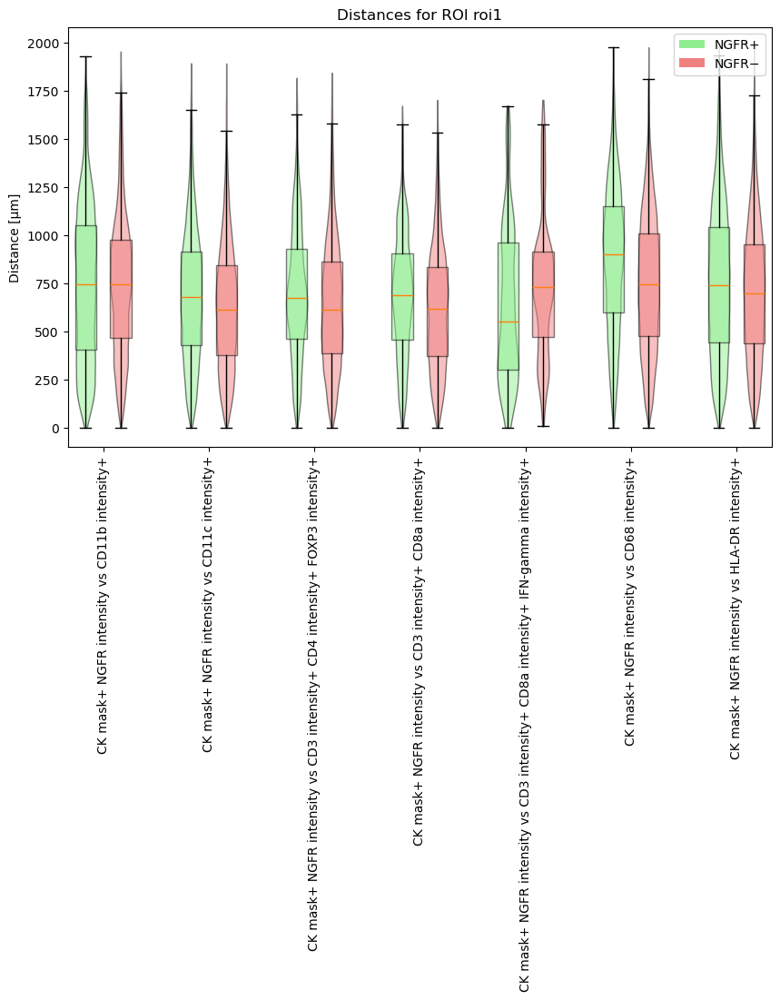

In [5]:
from multiplex_pipeline.config import (
    CNIO_USER,
    RESULTS_BASE_DIR,
    DISTANCES_POPULATIONS_DIR,
    BOXPLOTS_DISTANCES_HEATMAPS_DIR
)
from multiplex_pipeline.io.loaders import load_csv_data
from multiplex_pipeline.visualization.qc import generate_combined_boxplots

# 1) Cargar los datos desde el directorio de distancias poblacionales
subpop_data = load_csv_data(DISTANCES_POPULATIONS_DIR)

# 2) Generar los boxplots/violines tanto por subpoblación como por ROI
generate_combined_boxplots(
    dic_distancias=subpop_data,
    save_path=BOXPLOTS_DISTANCES_HEATMAPS_DIR
)
